In [94]:
import cv2
import numpy as np

def preprocess(img, target_h=15, max_w=128):
    """
    Resize grayscale img so its height == target_h, then
    scale width, and pad or truncate to max_w. Returns
    a float32 array shape (target_h, max_w, 1) in [0,1].
    """
    h, w = img.shape[:2]

    # 1) Scale so height == target_h
    scale = target_h / float(h)
    new_w = int(w * scale)
    img = cv2.resize(img, (new_w, target_h))

    # 2) Pad or truncate width to max_w
    if new_w < max_w:
        # pad right side with white (255)
        pad = np.ones((target_h, max_w - new_w), dtype=img.dtype) * 255
        img = np.concatenate([img, pad], axis=1)
    else:
        # truncate any extras on the right
        img = img[:, :max_w]

    # 3) Normalize to [0,1] and add channel dim
    img = img.astype('float32') / 255.0
    return img[..., np.newaxis]  # shape (32, max_w, 1)


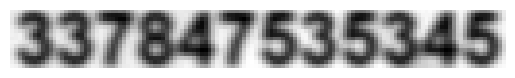

In [95]:
import glob
for path in glob.glob('augmented_samples/crops_id/id_13324.jpg'):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = preprocess(img, target_h=15, max_w=128)
    import matplotlib.pyplot as plt

    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()


In [96]:
import os, glob, cv2, numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd, string

# # Ground truth map
gt_valid = pd.read_csv('gt_2s.csv', dtype=str)
gt_valid['filename'] = gt_valid['filename'].str.replace(r'\.jpe?g$|\.png$', '', regex=True)
label_map_valid = dict(zip(gt_valid['filename'], gt_valid['id']))

gt_train = pd.read_csv("augmented_samples/crop_labels.csv", dtype=str)
id_gt = gt_train[gt_train["field"] == "ID"].copy()
id_gt["base"] = id_gt["crop_filename"] \
    .str.replace(r"\.jpe?g$|\.png$", "", regex=True)
label_map_train = dict(zip(id_gt["base"], id_gt["label"]))

# Vocabulary & encoder
char_list   = string.ascii_letters + string.digits
blank_index = len(char_list)
char_to_idx = {c:i for i,c in enumerate(char_list)}

def encode_to_labels(txt):
    return [char_to_idx[c] for c in txt if c in char_to_idx]

def load_split_train(folder_path, target_h=15, max_w=128):
    imgs, seqs, inp_lens, lbl_lens = [], [], [], []
    for img_path in glob.glob(os.path.join(folder_path, '*.jpg')):
        base = os.path.splitext(os.path.basename(img_path))[0]
        if base not in label_map_train:
            continue
        txt = label_map_train[base]
        raw = cv2.imread(img_path)
        raw= cv2.cvtColor(raw, cv2.COLOR_BGR2GRAY)
        # 1) Read grayscale
        h, w = raw.shape
        # skip if extremely small/large
        if h < 4 or w < 4:
            continue

        # 2) Preprocess to (32,128,1)
        img = preprocess(raw, target_h=target_h, max_w=max_w)

        # 3) Encode & record lengths
        seq= encode_to_labels(txt)
        imgs.append(img)
        seqs.append(seq)
        # Calculate input length based on model's output shape (31 timesteps)
        inp_lens.append(31)
        lbl_lens.append(len(seq))

    # 4) Determine max label length here if you want per-split, or do later globally
    return imgs, seqs, inp_lens, lbl_lens

def load_split_valid(folder_path, target_h=15, max_w=128):
    imgs, seqs, inp_lens, lbl_lens = [], [], [], []
    for img_path in glob.glob(os.path.join(folder_path, '*.jpg')):
        base = os.path.splitext(os.path.basename(img_path))[0]
        if base not in label_map_valid:
            continue
        txt = label_map_valid[base]
        raw = cv2.imread(img_path)
        raw= cv2.cvtColor(raw, cv2.COLOR_BGR2GRAY)
        # 1) Read grayscale
        h, w = raw.shape
        # skip if extremely small/large
        if h < 4 or w < 4:
            continue

        # 2) Preprocess to (32,128,1)
        img = preprocess(raw, target_h=target_h, max_w=max_w)

        # 3) Encode & record lengths
        seq= encode_to_labels(txt)
        imgs.append(img)
        seqs.append(seq)
        # Calculate input length based on model's output shape (31 timesteps)
        inp_lens.append(31)
        lbl_lens.append(len(seq))

    # 4) Determine max label length here if you want per-split, or do later globally
    return imgs, seqs, inp_lens, lbl_lens

# Load your data
train_imgs,  train_seqs,  train_in_l,  train_lb_l  = load_split_train('augmented_samples/crops_id')

valid_imgs, valid_seqs, valid_in_l, valid_lb_l = load_split_valid('cropped_id_valid_1')

# 5) Global padding
max_label_len = max(
    max(len(s) for s in train_seqs),
    max(len(s) for s in valid_seqs)
)

train_labels = pad_sequences(train_seqs, maxlen=max_label_len,
                             padding='post', value=len(char_list))
valid_labels = pad_sequences(valid_seqs, maxlen=max_label_len,
                             padding='post', value=len(char_list))

In [97]:
train_imgs_paths = [os.path.join('augmented_samples/crops_id', f) for f in os.listdir('augmented_samples/crops_id') if f.endswith('.jpg')]
valid_imgs_paths = [os.path.join('cropped_id_valid_1', f) for f in os.listdir('cropped_id_valid_1') if f.endswith('.jpg')]
# 1) Build reverse map from index → character
index_to_char = {i: c for i, c in enumerate(char_list)}

# 2) Helper to decode one padded label row
def decode_label_row(row):
    # row is a 1D array of length max_label_len
    # stop at the first blank_index or at padding (- any values >= blank_index)
    chars = []
    for idx in row:
        if idx < 0 or idx >= blank_index:
            break
        chars.append(index_to_char[idx])
    return ''.join(chars)

# 3) Print out a few examples from the training set
for i in range(5):
    # corresponding filename (without extension)
    filename = os.path.splitext(os.path.basename(train_imgs_paths[i]))[0]
    decoded = decode_label_row(train_labels[i])
    print(f"{filename}  →  {decoded}")

# 4) Likewise for validation
for i in range(5):
    filename = os.path.splitext(os.path.basename(valid_imgs_paths[i]))[0]
    print(f"{filename}  →  {decode_label_row(valid_labels[i])}")


id_11330  →  626709940088
id_01123  →  378051667896
id_06894  →  884230590804
id_08661  →  025246715900
id_07552  →  898937755951
img1473  →  080305006099
img1467  →  020092005281
img1498  →  027085009308
img1466  →  002086000477
img911  →  075204010026


In [98]:
print(f"Train set: {len(train_imgs)} images, max label len {max_label_len}")
print(f"Valid set: {len(valid_imgs)} images, max label len {max_label_len}")
print(f"Vocabulary size: {len(char_list) + 1} (including blank)")

Train set: 15000 images, max label len 12
Valid set: 60 images, max label len 12
Vocabulary size: 63 (including blank)


In [99]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import (
    Input, Lambda, Conv2D, MaxPool2D, BatchNormalization,
    Bidirectional, LSTM, Dense, Dropout
)
from tensorflow.keras.models import Model

# input with shape of height=15 and width=128 
inputs = Input(shape=(15,128,1))

# Conv 1
x = Conv2D(32,3,padding='same',activation='relu')(inputs)
x = BatchNormalization()(x)
x = MaxPool2D((2,2))(x)  # → (7,64,32)

# Conv 2
x = Conv2D(64,3,padding='same',activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D((2,2))(x)  # → (3,32,64)

# Conv 3 to collapse height
x = Conv2D(128,3,padding='same',activation='relu')(x)
x = MaxPool2D((3,1))(x)  # → (1,32,128)
   
x = Lambda(lambda t: K.squeeze(t,1))(x)

# Bi-LSTM stack
x = Bidirectional(LSTM(128, return_sequences=True, dropout=0.2))(x)
x = Bidirectional(LSTM(128, return_sequences=True, dropout=0.2))(x)
x = Bidirectional(LSTM(128, return_sequences=True, dropout=0.2))(x)

# Output
outputs = Dense(len(char_list)+1, activation='softmax')(x)
# Build model
model = Model(inputs, outputs)  
model.summary()



Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 15, 128, 1)]      0         
                                                                 
 conv2d_24 (Conv2D)          (None, 15, 128, 32)       320       
                                                                 
 batch_normalization_16 (Ba  (None, 15, 128, 32)       128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 7, 64, 32)         0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 7, 64, 64)         18496     
                                                                 
 batch_normalization_17 (Ba  (None, 7, 64, 64)         256

In [100]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint

# ─── your existing act_model definition ───
# inputs → convs → LSTMs → outputs (softmax over timesteps)
# assume that final softmax layer is called `outputs`

# 1) Define the four inputs

labels       = Input(shape=[max_label_len], name='the_labels',   dtype='int32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

print(input_length.shape, label_length.shape, labels.shape)


# 3) CTC loss via Lambda
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

loss_out = Lambda(
    ctc_lambda_func,
    output_shape=(1,),
    name='ctc'
)([outputs, labels, input_length, label_length])

# 4) The “training model”—it outputs the loss tensor
training_model = Model(
    inputs=[inputs, labels, input_length, label_length],
    outputs=loss_out
)

training_model.compile(
    loss={'ctc': lambda y_true, y_pred: y_pred},
    optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=3e-4),
)
filepath="best_model_id_1.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
callbacks_list = [checkpoint]


training_img = np.array(train_imgs)
train_input_length = np.array(train_in_l)
train_label_length = np.array(train_lb_l)

valid_img = np.array(valid_imgs)
valid_input_length = np.array(valid_in_l)
valid_label_length = np.array(valid_lb_l)

(None, 1) (None, 1) (None, 12)


In [101]:
training_model.fit(
    x=[training_img, train_labels, train_input_length, train_label_length],
    y=np.zeros(len(training_img)),
    batch_size=128,
    epochs=15,
    validation_data=(
        [valid_img, valid_labels, valid_input_length, valid_label_length],
        [np.zeros(len(valid_img))]
    ),
    callbacks=callbacks_list
)

Epoch 1/15
118/118 [==============================] - ETA: 0s - loss: 34.3412
Epoch 1: val_loss improved from inf to 36.18336, saving model to best_model_id_1.hdf5
118/118 [==============================] - 68s 518ms/step - loss: 34.3412 - val_loss: 36.1834
Epoch 2/15


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


118/118 [==============================] - ETA: 0s - loss: 29.6529
Epoch 2: val_loss improved from 36.18336 to 31.18405, saving model to best_model_id_1.hdf5
118/118 [==============================] - 61s 519ms/step - loss: 29.6529 - val_loss: 31.1840
Epoch 3/15
118/118 [==============================] - ETA: 0s - loss: 28.9410
Epoch 3: val_loss improved from 31.18405 to 30.55115, saving model to best_model_id_1.hdf5
118/118 [==============================] - 64s 539ms/step - loss: 28.9410 - val_loss: 30.5511
Epoch 4/15
118/118 [==============================] - ETA: 0s - loss: 21.9223
Epoch 4: val_loss improved from 30.55115 to 19.25962, saving model to best_model_id_1.hdf5
118/118 [==============================] - 62s 524ms/step - loss: 21.9223 - val_loss: 19.2596
Epoch 5/15
118/118 [==============================] - ETA: 0s - loss: 5.4477
Epoch 5: val_loss improved from 19.25962 to 3.30182, saving model to best_model_id_1.hdf5
118/118 [==============================] - 57s 486ms/st

In [114]:
import glob
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend as K


# 2) Load the best weights into that same model
model.load_weights('best_model_id.hdf5', by_name=True)
# 3) Prepare your mappings
BLANK = len(char_list)
index_to_char = {i: c for i, c in enumerate(char_list)}

# 4) Load + preprocess all validation images
valid_paths = sorted(glob.glob('cropped_id_train_1/*.jpg'))
imgs, bases = [], []
for p in valid_paths:
    raw = cv2.imread(p, cv2.IMREAD_COLOR)
    raw = cv2.cvtColor(raw, cv2.COLOR_BGR2GRAY)  # convert to grayscale
    img = preprocess(raw, target_h=15, max_w=128)   # → (15, w, 1)
    imgs.append(img)
    bases.append(os.path.splitext(os.path.basename(p))[0])
imgs = np.stack(imgs, axis=0)    # → (N_valid, 15, w, 1)

# 5) Predict the per-timestep softmax
y_pred = model.predict(imgs)  
#    shape = (N_valid, time_steps, num_classes)

# 6) Build input lengths for CTC
input_len = np.ones((y_pred.shape[0],), dtype='int32') * y_pred.shape[1]

# 7) Greedy CTC decode
decoded, _ = K.ctc_decode(    
    y_pred,
    input_length=input_len,
    greedy=True
)
decoded = decoded[0].numpy()     # → (N_valid, ≤time_steps)

# 8) Convert integer sequences back to strings
pred_texts = []
for seq in decoded:
    chars = [index_to_char[i] for i in seq if 0 <= i < len(char_list)]
    pred_texts.append(''.join(chars))

# 1) Identify wrong and right predictions
wrong, right = [], []
for path, base, pred in zip(valid_paths, bases, pred_texts):
    true = label_map_valid.get(base, '<missing>')
    if pred != true:
        wrong.append((os.path.basename(path), pred, true))
    else:
        right.append((os.path.basename(path), pred, true))

# 2) Print wrong predictions
print("\nWrong predictions:")
for fname, pred, true in wrong:
    print(f"{fname}  →  pred: {pred} true: {true}")

# 4) Overall accuracy
total = len(pred_texts)
num_correct = len(right)
accuracy = num_correct / total * 100
print(f"\nAccuracy: {num_correct}/{total} = {accuracy:.2f}%")


6/6 [==============================] - 0s 42ms/step

Wrong predictions:
img1302.jpg  →  pred: 07930804547 true: 079308045547
img1581.jpg  →  pred: 01330195000010 true: 033095000010
img1614.jpg  →  pred: 004420500818 true: 044205008186

Accuracy: 182/185 = 98.38%


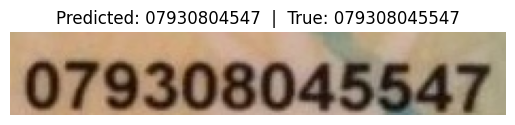

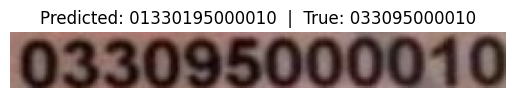

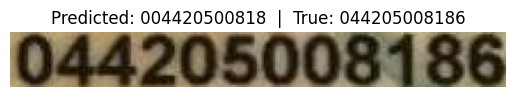

In [106]:
import os
import cv2
import matplotlib.pyplot as plt

# assume output_dir is where your crops are saved
output_dir = 'cropped_id_train_1'

# Show the first 5 correctly-predicted images
for fname, pred, true in wrong:
    img_path = os.path.join(output_dir, fname)
    # 1) read in BGR space
    bgr = cv2.imread(img_path)
    # 2) convert to RGB
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    
    plt.figure()
    plt.imshow(rgb)  # now shown in true color
    plt.title(f"Predicted: {pred}  |  True: {true}")
    plt.axis('off')
    plt.show()


In [108]:
model.save('model_id_1.h5')

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [109]:
model.save('model_id_1.keras')

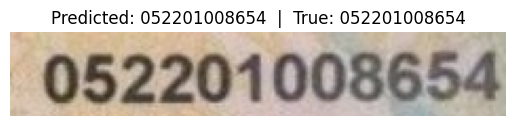

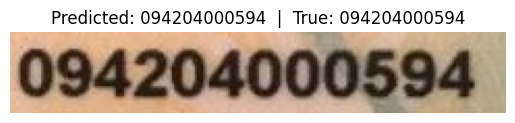

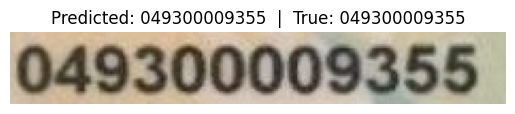

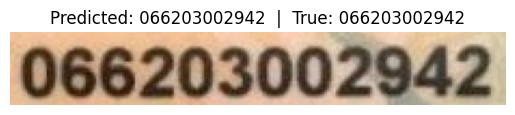

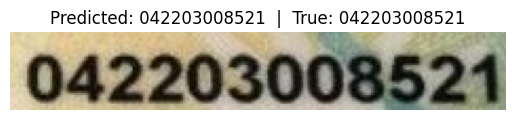

...

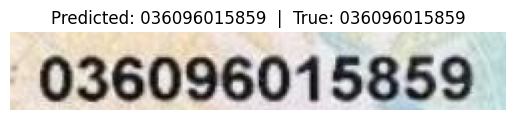

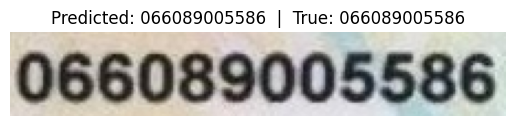

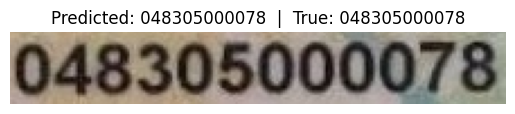

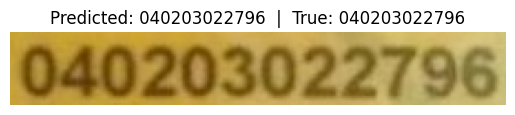

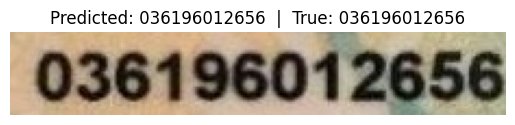

In [69]:
import os
import cv2
import matplotlib.pyplot as plt

# assume output_dir is where your crops are saved
output_dir = 'cropped_id_train_1'

# Show the first 5 correctly-predicted images
for fname, pred, true in right:
    img_path = os.path.join(output_dir, fname)
    # 1) read in BGR space
    bgr = cv2.imread(img_path)
    # 2) convert to RGB
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    
    plt.figure()
    plt.imshow(rgb)  # now shown in true color
    plt.title(f"Predicted: {pred}  |  True: {true}")
    plt.axis('off')
    plt.show()


In [131]:
import glob
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend as K


# 2) Load the best weights into that same model
model.load_weights('best_model_id.hdf5', by_name=True)
# 3) Prepare your mappings
BLANK = len(char_list)
index_to_char = {i: c for i, c in enumerate(char_list)}

# 4) Load + preprocess all validation images
valid_paths = sorted(glob.glob('cropped_ids_valid/*.jpg'))
imgs, bases = [], []
for p in valid_paths:
    raw = cv2.imread(p, cv2.IMREAD_COLOR)
    raw = cv2.cvtColor(raw, cv2.COLOR_BGR2GRAY)  # convert to grayscale
    img = preprocess(raw, target_h=15, max_w=128)   # → (15, w, 1)
    imgs.append(img)
    bases.append(os.path.splitext(os.path.basename(p))[0])
imgs = np.stack(imgs, axis=0)    # → (N_valid, 15, w, 1)

# 5) Predict the per-timestep softmax
y_pred = model.predict(imgs)  
#    shape = (N_valid, time_steps, num_classes)

# 6) Build input lengths for CTC
input_len = np.ones((y_pred.shape[0],), dtype='int32') * y_pred.shape[1]

# 7) Greedy CTC decode
decoded, _ = K.ctc_decode(    
    y_pred,
    input_length=input_len,
    greedy=True
)
decoded = decoded[0].numpy()     # → (N_valid, ≤time_steps)

# 8) Convert integer sequences back to strings
pred_texts = []
for seq in decoded:
    chars = [index_to_char[i] for i in seq if 0 <= i < len(char_list)]
    pred_texts.append(''.join(chars))

# 1) Identify wrong and right predictions
wrong, right = [], []
for path, base, pred in zip(valid_paths, bases, pred_texts):
    true = label_map_valid.get(base, '<missing>')
    if pred != true:
        wrong.append((os.path.basename(path), pred, true))
    else:
        right.append((os.path.basename(path), pred, true))

# 2) Print wrong predictions
print("\nWrong predictions:")
for fname, pred, true in wrong:
    print(f"{fname}  →  pred: {pred} true: {true}")

# 4) Overall accuracy
total = len(pred_texts)
num_correct = len(right)
accuracy = num_correct / total * 100
print(f"\nAccuracy: {num_correct}/{total} = {accuracy:.2f}%")


2/2 [==============================] - 0s 45ms/step

Wrong predictions:
img1399.jpg  →  pred: 52010447 true: 082202010447
img1498.jpg  →  pred: 027095009309 true: 027085009308

Accuracy: 58/60 = 96.67%


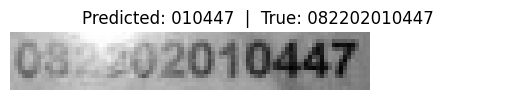

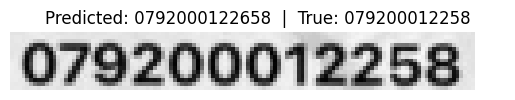

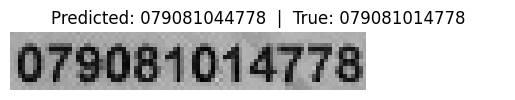

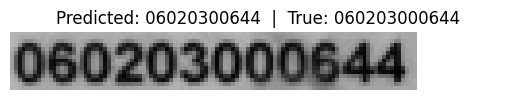

In [69]:
import os
import cv2
import matplotlib.pyplot as plt

# assume output_dir is where your crops are saved
output_dir = 'cropped_ids_valid'

# Show the first 5 correctly-predicted images
for fname, pred, true in wrong:
    img_path = os.path.join(output_dir, fname)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = preprocess(img, target_h=15, max_w=128)
    
    plt.figure()
    plt.imshow(img, cmap='gray')              # display as grayscale
    plt.title(f"Predicted: {pred}  |  True: {true}")
    plt.axis('off')
    plt.show()





In [130]:
import glob
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend as K


# 2) Load the best weights into that same model
model.load_weights('best_model_id.hdf5', by_name=True)

# 3) Prepare your mappings
BLANK = len(char_list)
index_to_char = {i: c for i, c in enumerate(char_list)}

# 4) Load + preprocess all validation images
valid_paths = sorted(glob.glob('cropped_my_id_test/*.jpg'))
imgs, bases = [], []
for p in valid_paths:
    raw = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    img = preprocess(raw, target_h=15, max_w=128)   # → (15, w, 1)
    imgs.append(img)
    bases.append(os.path.splitext(os.path.basename(p))[0])
imgs = np.stack(imgs, axis=0)    # → (N_valid, 15, w, 1)

# 5) Predict the per-timestep softmax
y_pred = model.predict(imgs)  
#    shape = (N_valid, time_steps, num_classes)

# 6) Build input lengths for CTC
input_len = np.ones((y_pred.shape[0],), dtype='int32') * y_pred.shape[1]

# 7) Greedy CTC decode
decoded, _ = K.ctc_decode(    
    y_pred,
    input_length=input_len,
    greedy=True
)
decoded = decoded[0].numpy()     # → (N_valid, ≤time_steps)

# 8) Convert integer sequences back to strings
pred_texts = []
for seq in decoded:
    chars = [index_to_char[i] for i in seq if 0 <= i < len(char_list)]
    pred_texts.append(''.join(chars))

# 1) Identify wrong and right predictions
wrong, right = [], []
for path, base, pred in zip(valid_paths, bases, pred_texts):
    print(f"{os.path.basename(path)}  →  pred: {pred}")


1/1 [==============================] - 0s 37ms/step
110.jpg  →  pred: 048203004548
28.jpg  →  pred: 087077002799
29.jpg  →  pred: 096202006939
4.jpg  →  pred: 082196013498
54.jpg  →  pred: 070203005812
60.jpg  →  pred: 048203008958
78.jpg  →  pred: 054203004127
99.jpg  →  pred: 034203011524
img1.jpg  →  pred: 025204000166
img2.jpg  →  pred: 025204000166
img3.jpg  →  pred: 025204000166
img4.jpg  →  pred: 001204016630
img6.jpg  →  pred: 001204016630
